In [145]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.metrics import accuracy_score, classification_report
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay)
import seaborn as sns
from tqdm import tqdm
from rembg import remove

## Data Loading

Buat struktur folder dataset sebagai berikut:
```
.
└──dataset
    ├── label1
	├── image1.jpg
	├── image2.jpg
	└── image3.jpg
    ├── label2
    └── label3
    └── dst...
```

In [146]:
data = []
labels = []
file_name = []
for sub_folder in os.listdir("dataset\\"):
    sub_folder_files = os.listdir(os.path.join("dataset\\", sub_folder))
    for i, filename in enumerate(sub_folder_files):
        img_path = os.path.join("dataset\\", sub_folder, filename)
        img = plt.imread(img_path)
        
        data.append(img)
        labels.append(sub_folder)
        name = os.path.splitext(filename)[0]
        file_name.append(filename)
        
data = np.array(data)
labels = np.array(labels)


## Data Augmentation

### Define Augmentation Function


In [147]:
# melakukan augmentasi data
data_augmented = []
labels_augmented = []
paths_augmented = []
file_name_augmented = []
for i in range(len(data)):
	pass

In [148]:
print("Data sebelum augmentasi: ", len(data))
print("Data setelah augmentasi: ", len(data_augmented))

Data sebelum augmentasi:  300
Data setelah augmentasi:  0


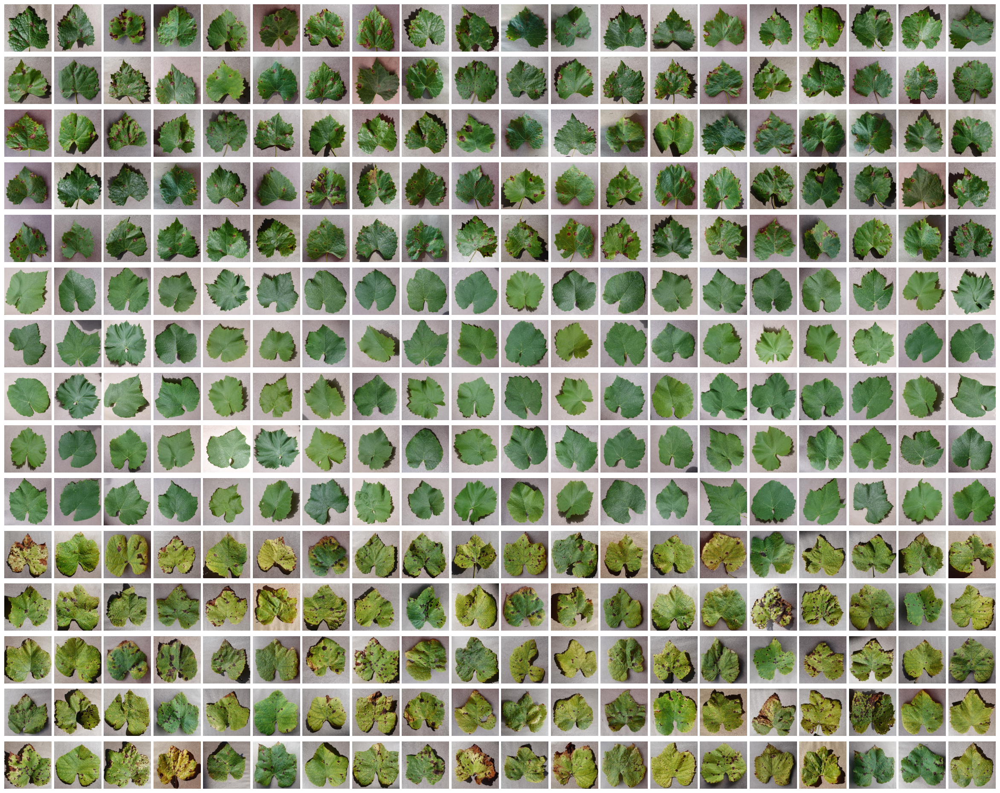

In [149]:
max_display = 400
display_data = data[:max_display]

columns = 20
total = len(display_data)
rows = -(-total // columns)

fig, axes = plt.subplots(nrows=rows, ncols=columns, figsize=(30, 24))

axes_list = axes.ravel() if total > 1 else [axes]

for idx in range(rows * columns):
    ax = axes_list[idx]
    if idx < total:
        ax.imshow(display_data[idx])
    ax.axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

In [150]:
# Siapkan dictionary kosong
data_kategori = {}

# Bangun struktur kategori -> list of (filename, image)
for img, label, fname in zip(data, labels, file_name):
    if label not in data_kategori:
        data_kategori[label] = []
    data_kategori[label].append((fname, img))  # (filename, image)

In [151]:
def removeBackgroundByCategory(data):
    removed_data = {}
    for kategori, items in data.items():
        removed_list = []
        for filename, img in tqdm(items, desc=f"remove background {kategori}"):
            img_removed = remove(img)
            removed_list.append((filename, img_removed))
        removed_data[kategori] = removed_list
    return removed_data

# 4. Fungsi grayscaling
def gray_scaling(data):
    gray_data = {}
    for kategori, items in data.items():
        gray_list = []
        for filename, img in tqdm(items, desc=f"grayscaling {kategori}"):
            gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
            gray_list.append((filename, gray))  
        gray_data[kategori] = gray_list
    return gray_data

# 5. Jalankan proses
removej = removeBackgroundByCategory(data_kategori)
grayj = gray_scaling(removej)

remove background Grape___healthy: 100%|██████████| 100/100 [02:37<00:00,  1.57s/it]
remove background Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 100%|██████████| 100/100 [02:34<00:00,  1.55s/it]
grayscaling Grape___healthy: 100%|██████████| 100/100 [00:00<00:00, 14243.57it/s]
grayscaling Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 100%|██████████| 100/100 [00:00<00:00, 10432.55it/s]


Kategori: Grape___Black_rot


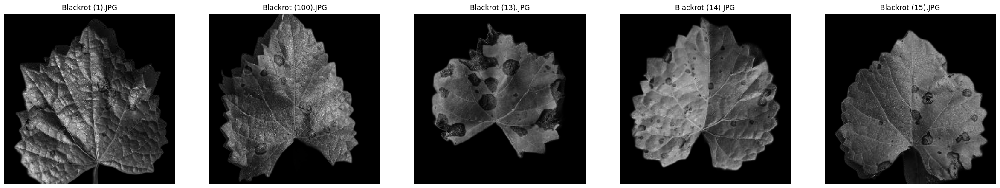

Kategori: Grape___healthy


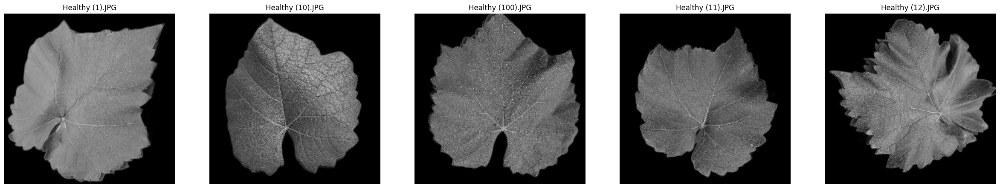

Kategori: Grape___Leaf_blight_(Isariopsis_Leaf_Spot)


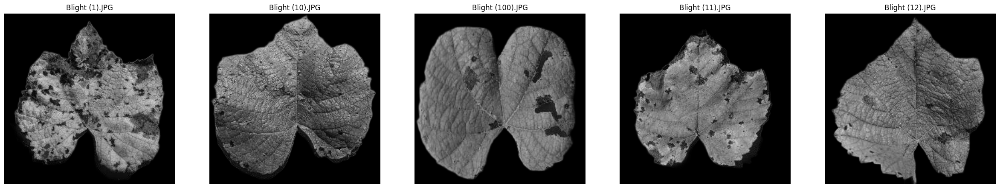

In [152]:
n_display = 5

for kategori, items in grayj.items():
    print(f"Kategori: {kategori}")
    plt.figure(figsize=(30, 15))
    
    for i, (filename, img) in enumerate(items[:n_display]):
        plt.subplot(1, n_display, i+1)
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGRA2RGBA))
        plt.title(filename)
        plt.axis('off')
    
    plt.show()


## Data Preparation

### Define Preprocessing Function


In [153]:
def resize(img, th, tw):
    h, w = img.shape
    resized = np.zeros((th, tw), dtype=np.uint8)
    
    skala_y = h / th
    skala_x = w / tw
    
    for i in range(th):
        for j in range(tw):
            src_y = int(i * skala_y)
            src_x = int(j * skala_x)
            resized[i, j] = img[src_y, src_x]
    
    return resized

def normalisasi(img):
    min_val = np.min(img)
    max_val = np.max(img)
    if max_val - min_val == 0:
        return np.zeros_like(img, dtype=np.uint8)
    normalized_img = ((img - min_val) / (max_val - min_val)) * 255
    return normalized_img.astype(np.uint8)


def op_modus (piksel_values):
    count = {}
    for num in piksel_values:
        if num in count:
            count[num] +=1
        else:
            count[num] = 1

    max_count = 0
    modus = None
    for num in count:
        if count[num] > max_count:
            max_count = count[num]
            modus = num
    return modus

def op_median(piksel_values):
    n = len(piksel_values)
    sorted_piksel = sorted(piksel_values)
    if n % 2 == 0:
        median1 = sorted_piksel[n//2]
        median2 = sorted_piksel[n//2-1]
        median = (median1 + median2)/2
    else:
        median = sorted_piksel[n//2]
    return median

def konvo_modmed(img, kernel, jenis):
    img_h, img_w = img.shape
    kernel_h, kernel_w = kernel.shape
    pad_h = kernel_h //2
    pad_w = kernel_w //2
    pad_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='edge')
    result = np.zeros_like(img)

    for i in range(img_h):
        for j in range (img_w):
            temp = np.zeros(len(kernel)*len(kernel))
            indeks = 0
            for k in range (kernel_h):
                for l in range (kernel_w):
                    temp[indeks] += pad_img[i+k, j+l]
                    indeks+=1
                    if(jenis=="modus"):
                        result[i, j] = op_modus(temp)
                    else:
                        result[i, j] = op_median(temp)
    return result

Rt = np.array([[1,0],
               [0,-1]])

Rk = np.array([[0,1],
               [-1,0]])

Sx = np.array([[-1,0,1],
               [-2,0,2],
               [-1,0,1]])

Sy = np.array([[1,2,1],
               [0,0,0],
               [-1,-2,-1]])

Px = np.array([[-1,0,1],
               [-1,0,1],
               [-1,0,1]])

Py = np.array([[1,1,1],
               [0,0,0],
               [-1,-1,-1]])

kernel_3x3 = np.full((3,3), 1/9)
kernel3x3_empty = np.full((3,3), 0)

def padding_baris(img):
    h, w = img.shape
    img_pad = np.zeros((h, w+1))
    for i in range(h):
        for j in range(w):
            img_pad[i][j] = img[i][j]
    return img_pad

def padding_kolom(img):
    h, w = img.shape
    img_pad = np.zeros((h+1, w))
    for i in range(h):
        for j in range(w):
            img_pad[i][j] = img[i][j]
    return img_pad

def konvo_edge(img, kernel, jenis):
    img_h, img_w = img.shape
    kernel_h, kernel_w = kernel.shape
    pad_h = kernel_h //2
    pad_w = kernel_w //2
    if(jenis!="roberts"):
        padded_img =  np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    else:
        padded_baris = padding_baris(img)
        padded_img = padding_kolom(padded_baris)
    result = np.zeros([img_h, img_w])

    for i in range(img_h):
        for j in range(img_w):
            result[i, j] = np.sum(padded_img[i:i+kernel_h, j:j+kernel_w] * kernel)
    return result

def edge(image, kernelX, kernelY, jenis):
    gradX = konvo_edge(image, kernelX, jenis)
    gradY = konvo_edge(image, kernelY, jenis)

    M = np.sqrt((gradX*gradX)+(gradY*gradY))

    return M.astype(np.uint8)


### Preprocessing

In [154]:
data = []

for items in grayj.values():
    for _, img in items:
        data.append(img)


In [155]:
dataPreprocessed = []
for i in range(len(data)): # Loop through each image and do preprocessing
	img = data[i]
	img = resize(img, 128, 128)
	img = normalisasi(img)
	img = konvo_modmed(img, kernel3x3_empty, "median")  # kernel 3x3
	img = edge(img, Sx, Sy, "sobel")

	dataPreprocessed.append(img)

	

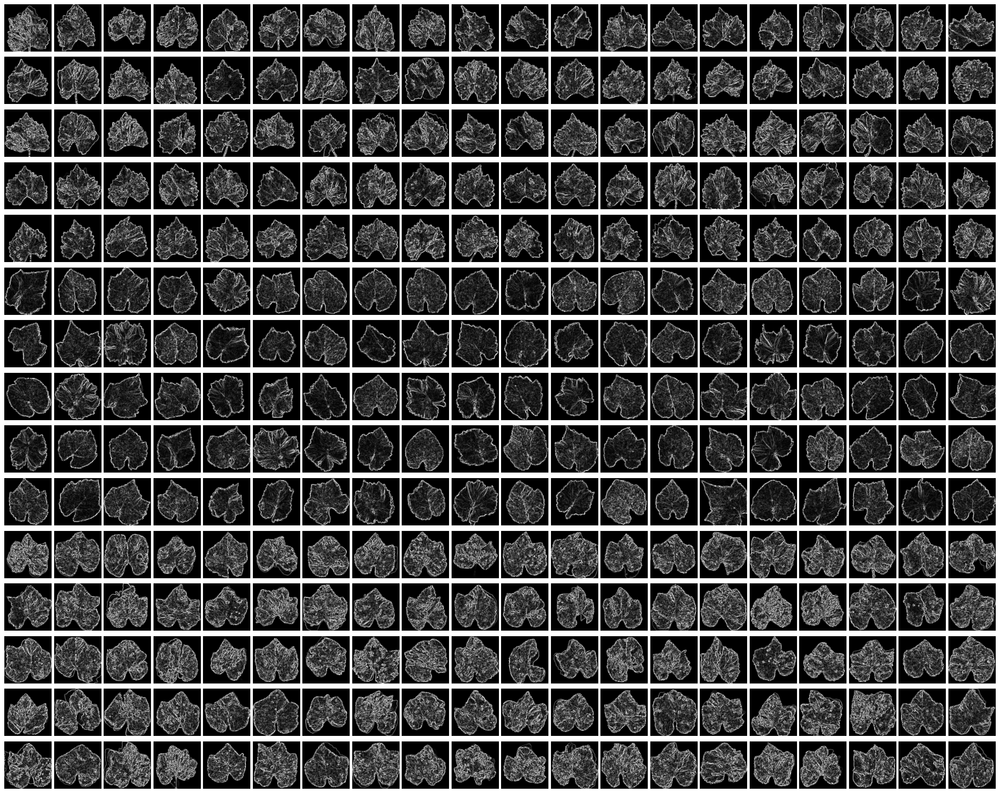

In [156]:
max_display = 400
display_data = dataPreprocessed[:max_display]

columns = 20
total = len(display_data)
rows = -(-total // columns)

fig, axes = plt.subplots(nrows=rows, ncols=columns, figsize=(30, 24))

axes_list = axes.ravel() if total > 1 else [axes]

for idx in range(rows * columns):
    ax = axes_list[idx]
    if idx < total:
        ax.imshow(display_data[idx], cmap='gray')
    ax.axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

### Feature Extraction

In [157]:
def glcm(image, derajat):
    if derajat == 0:
        angles = [0]
    elif derajat == 45:
        angles = [np.pi / 4]
    elif derajat == 90:
        angles = [np.pi / 2]
    elif derajat == 135:
        angles = [3 * np.pi / 4]
    else:
        raise ValueError("Invalid angle. It should be one of the following: 0, 45, 90, 135.")
    
    glcm = graycomatrix(image, [1], angles, 256, symmetric=True, normed=True)
    return glcm

In [158]:
def correlation(matriks):
	return graycoprops(matriks, 'correlation')[0, 0]

In [159]:
def dissimilarity(matriks):
    return graycoprops(matriks, 'dissimilarity')[0, 0]

In [160]:
def homogenity(matriks):
    return graycoprops(matriks, 'homogeneity')[0, 0]

In [161]:
def contrast(matriks):
    return graycoprops(matriks, 'contrast')[0, 0]

In [162]:
def ASM(matriks):
    return graycoprops(matriks, 'ASM')[0, 0]

In [163]:
def energy(matriks):
    return graycoprops(matriks, 'energy')[0, 0]

In [164]:
def entropyGlcm(matriks):
    return entropy(matriks.ravel())

In [165]:
Derajat0 = []
Derajat45 = []
Derajat90 = []
Derajat135 = []
for i in range(len(dataPreprocessed)):
    D0 = glcm(dataPreprocessed[i], 0)
    D45 = glcm(dataPreprocessed[i], 45)
    D90 = glcm(dataPreprocessed[i], 90)
    D135 = glcm(dataPreprocessed[i], 135)
    Derajat0.append(D0)
    Derajat45.append(D45)
    Derajat90.append(D90)
    Derajat135.append(D135)

In [166]:
Kontras0, Kontras45, Kontras90, Kontras135 = [], [], [], []
dissimilarity0, dissimilarity45, dissimilarity90, dissimilarity135 =  [], [], [], []
homogenity0, homogenity45, homogenity90, homogenity135 = [], [], [], []
entropy0, entropy45, entropy90, entropy135 =  [], [], [], []
ASM0, ASM45, ASM90, ASM135 =  [], [], [], []
energy0, energy45, energy90, energy135 =  [], [], [], []
correlation0, correlation45, correlation90, correlation135 = [], [], [], []


In [167]:
for i in range(len(dataPreprocessed)):
    C0 = correlation(Derajat0[i])
    correlation0.append(C0)
    C45 = correlation(Derajat45[i])
    correlation45.append(C45)
    C90 = correlation(Derajat90[i])
    correlation90.append(C90)
    C135 = correlation(Derajat135[i])
    correlation135.append(C135)

In [168]:
for i in range(len(dataPreprocessed)):
    K0 = contrast(Derajat0[i])
    K45 = contrast(Derajat45[i])
    K90 = contrast(Derajat90[i])
    K135 = contrast(Derajat135[i])
    Kontras0.append(K0)
    Kontras45.append(K45)
    Kontras90.append(K90)
    Kontras135.append(K135)

In [169]:
for i in range(len(dataPreprocessed)):
    Dis0 = dissimilarity(Derajat0[i])
    Dis45 = dissimilarity(Derajat45[i])
    Dis90 = dissimilarity(Derajat90[i])
    Dis135 = dissimilarity(Derajat135[i])
    dissimilarity0.append(Dis0)
    dissimilarity45.append(Dis45)
    dissimilarity90.append(Dis90)
    dissimilarity135.append(Dis135)

In [170]:
for i in range(len(dataPreprocessed)):
    H0 = homogenity(Derajat0[i])
    H45 = homogenity(Derajat45[i])
    H90 = homogenity(Derajat90[i])
    H135 = homogenity(Derajat135[i])
    homogenity0.append(H0)
    homogenity45.append(H45)
    homogenity90.append(H90)
    homogenity135.append(H135)

In [171]:
for i in range(len(dataPreprocessed)):  
    E0 = entropyGlcm(Derajat0[i])
    E45 = entropyGlcm(Derajat45[i])
    E90 = entropyGlcm(Derajat90[i])
    E135 = entropyGlcm(Derajat135[i])
    entropy0.append(E0)
    entropy45.append(E45)
    entropy90.append(E90)
    entropy135.append(E135)

In [172]:
for i in range(len(dataPreprocessed)):
    A0 = ASM(Derajat0[i])
    A45 = ASM(Derajat45[i])
    A90 = ASM(Derajat90[i])
    A135 = ASM(Derajat135[i])
    ASM0.append(A0)
    ASM45.append(A45)
    ASM90.append(A90)
    ASM135.append(A135)

In [173]:
for i in range(len(dataPreprocessed)):
    ER0 = energy(Derajat0[i])
    ER45 = energy(Derajat45[i])
    ER90 = energy(Derajat90[i])
    ER135 = energy(Derajat135[i])
    energy0.append(ER0)
    energy45.append(ER45)
    energy90.append(ER90)
    energy135.append(ER135)

In [174]:
print("Jumlah Filename:", len(file_name))
print("Jumlah Label:", len(labels))
print("Jumlah Kontras0:", len(Kontras0))
print("Jumlah Kontras45:", len(Kontras45))
print("Jumlah Kontras90:", len(Kontras90))
print("Jumlah Kontras135:", len(Kontras135))
print("Jumlah Homogeneity0:", len(homogenity0))
print("Jumlah Homogeneity45:", len(homogenity45))
print("Jumlah Homogeneity90:", len(homogenity90))
print("Jumlah Homogeneity135:", len(homogenity135))
print("Jumlah Entropy0:", len(entropy0))
print("Jumlah Entropy45:", len(entropy45))
print("Jumlah Entropy90:", len(entropy90))
print("Jumlah Entropy135:", len(entropy135))
print("Jumlah Correlation0:", len(correlation0))
print("Jumlah Correlation45:", len(correlation45))
print("Jumlah Correlation90:", len(correlation90))
print("Jumlah Correlation135:", len(correlation135))


Jumlah Filename: 300
Jumlah Label: 300
Jumlah Kontras0: 300
Jumlah Kontras45: 300
Jumlah Kontras90: 300
Jumlah Kontras135: 300
Jumlah Homogeneity0: 300
Jumlah Homogeneity45: 300
Jumlah Homogeneity90: 300
Jumlah Homogeneity135: 300
Jumlah Entropy0: 300
Jumlah Entropy45: 300
Jumlah Entropy90: 300
Jumlah Entropy135: 300
Jumlah Correlation0: 300
Jumlah Correlation45: 300
Jumlah Correlation90: 300
Jumlah Correlation135: 300


### Write the extraction's results to CSV 

In [175]:
dataTable = {'Filename': file_name, 'Label': labels,
        'Contrast0': Kontras0, 'Contrast45': Kontras45, 'Contrast90': Kontras90, 'Contrast135': Kontras135,
        'Homogeneity0': homogenity0, 'Homogeneity45': homogenity45, 'Homogeneity90': homogenity90, 'Homogeneity135': homogenity135,
        'Dissimilarity0': dissimilarity0, 'Dissimilarity45': dissimilarity45, 'Dissimilarity90': dissimilarity90, 'Dissimilarity135': dissimilarity135,
        'Entropy0': entropy0, 'Entropy45': entropy45, 'Entropy90': entropy90, 'Entropy135': entropy135,
        'ASM0': ASM0, 'ASM45': ASM45, 'ASM90': ASM90, 'ASM135': ASM135,
        'Energy0': energy0, 'Energy45': energy45, 'Energy90': energy90, 'Energy135': energy135,
        'Correlation0': correlation0, 'Correlation45': correlation45, 'Correlation90': correlation90, 'Correlation135': correlation135,
        }
df = pd.DataFrame(dataTable)
df.to_csv('hasil_ekstraksi_1.csv', index=False)

hasilEkstrak = pd.read_csv('hasil_ekstraksi_1.csv')
hasilEkstrak


,Filename,Label,Contrast0,Contrast45,Contrast90,Contrast135,Homogeneity0,Homogeneity45,Homogeneity90,Homogeneity135,...,ASM90,ASM135,Energy0,Energy45,Energy90,Energy135,Correlation0,Correlation45,Correlation90,Correlation135
0,Blackrot (1).JPG,Grape___Black_rot,2695.437377,2961.866080,2487.714444,3472.530349,0.356717,0.347902,0.360099,0.343951,...,0.110491,0.104199,0.329639,0.322561,0.332402,0.322799,0.669008,0.636087,0.693829,0.573343
1,Blackrot (100).JPG,Grape___Black_rot,1565.164862,1792.047492,1318.642963,1980.641205,0.442335,0.434554,0.450451,0.434089,...,0.174959,0.166053,0.413607,0.408118,0.418281,0.407496,0.711737,0.670676,0.756887,0.636018
2,Blackrot (13).JPG,Grape___Black_rot,1928.052534,2287.822804,1937.194267,2298.246884,0.556439,0.547068,0.558859,0.548207,...,0.289434,0.281110,0.536822,0.530632,0.537991,0.530198,0.716823,0.665530,0.715481,0.664006
3,Blackrot (14).JPG,Grape___Black_rot,2293.853346,3107.709839,2242.958292,2568.128216,0.404386,0.391738,0.408163,0.395552,...,0.145146,0.138346,0.379321,0.371328,0.380980,0.371949,0.682401,0.570955,0.689449,0.645449
4,Blackrot (15).JPG,Grape___Black_rot,1807.652313,2065.435427,1585.633612,2338.362329,0.417992,0.408470,0.421098,0.406048,...,0.151554,0.145262,0.386533,0.380458,0.389300,0.381133,0.685616,0.641246,0.723650,0.593840
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,Blight (95).JPG,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),2588.977239,3059.667927,2236.671875,3003.294067,0.416789,0.408014,0.421350,0.408294,...,0.160570,0.153099,0.398869,0.392085,0.400712,0.391278,0.681572,0.624573,0.724904,0.631490
296,Blight (96).JPG,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),2430.159449,2880.119164,2212.643086,2952.841466,0.428770,0.418853,0.432983,0.419061,...,0.165803,0.159038,0.406202,0.397869,0.407189,0.398795,0.695578,0.640221,0.722826,0.631136
297,Blight (97).JPG,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),2306.903420,2703.357803,1941.804011,2912.441689,0.383373,0.373830,0.388091,0.370140,...,0.129432,0.122116,0.358166,0.350133,0.359766,0.349451,0.673033,0.617748,0.724780,0.588184
298,Blight (98).JPG,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),1791.135581,2097.020894,1690.741019,2384.234732,0.383737,0.372300,0.384644,0.370314,...,0.123285,0.117749,0.351055,0.342842,0.351120,0.343145,0.697228,0.646541,0.714195,0.598130


### Features Selection

pada bagian seleksi fitur ini bisa menggunakan metode seperti
- PCA
- LDA
- t-SNE
- Chi-square
- ANOVA
- Autoencoder
- correlation
- dll

berikut contoh menggunakan correlation:

<Axes: >

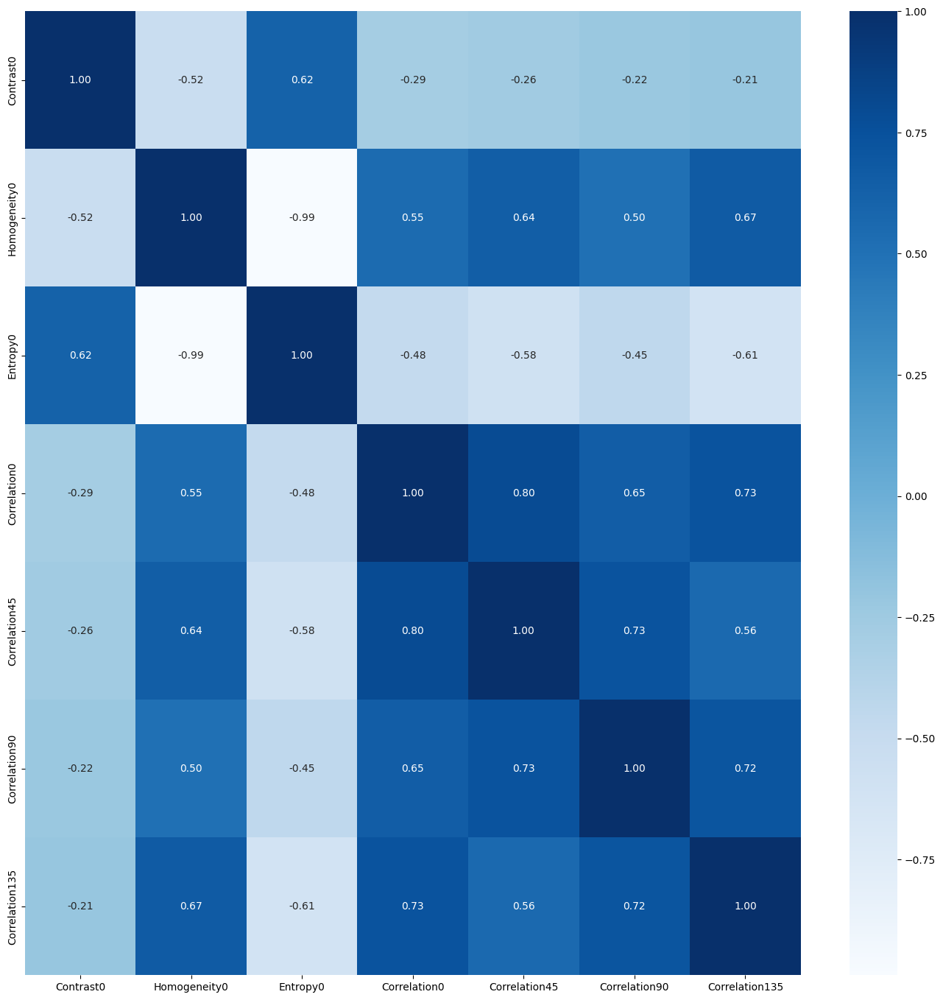

In [176]:
# Menghitung korelasi
correlation = hasilEkstrak.drop(columns=['Label','Filename']).corr()

# Menyaring fitur yang memiliki korelasi absolut lebih dari 0.95 dengan label
threshold = 0.95 # atur threshold ini untuk menentukan seberapa besar korelasi yang ingin disaring
selectionFeature = []
columns = np.full((correlation.shape[0],), True, dtype=bool)
for i in range(correlation.shape[0]):
	for j in range(i+1, correlation.shape[0]):
		if correlation.iloc[i,j] >= threshold:
			if columns[j]:
				columns[j] = False
select = hasilEkstrak.drop(columns=['Label','Filename']).columns[columns]
x_new = hasilEkstrak[select]
x_new
y = hasilEkstrak['Label']
plt.figure(figsize=(17,17))
sns.heatmap(x_new.corr(), annot=True, cmap='Blues', fmt=".2f")

## Splitting Data

In [177]:
# 0.3 = 30% data untuk testing (train/test 70/30)
# 0.2 = 20% data untuk testing (train/test 80/20)
X_train, X_test, y_train, y_test = train_test_split(x_new, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)

(240, 7)
(60, 7)


## Feature Normalization

berikut metode normalisasi yang bisa digunakan:
- Min-Max Scaling
- Standardization (Z-score)
- Robust Scaling
- MaxAbsScaler
- dll

berikut contoh menggunakan Standardization (Z-score):

In [178]:
X_test = (X_test - X_train.mean()) / X_train.std()
X_train = (X_train - X_train.mean()) / X_train.std()

## Modeling

### Define Model

In [229]:
def generateClassificationReport(y_true, y_pred):
	print(classification_report(y_true, y_pred))
	print(confusion_matrix(y_true, y_pred))
	print('Accuracy:', accuracy_score(y_true, y_pred))

# Define classifiers
rf = RandomForestClassifier(n_estimators=4, random_state=42)
svm = SVC(kernel='rbf', random_state=42)
knn = KNeighborsClassifier(n_neighbors=5)

### Train Random Forest Classifier

In [230]:
rf.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("------Training Set------")
y_pred = rf.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = rf.predict(X_test)
generateClassificationReport( y_test, y_pred)

------Training Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.90      0.95      0.93        78
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.94      0.94      0.94        78
                           Grape___healthy       1.00      0.95      0.98        84

                                  accuracy                           0.95       240
                                 macro avg       0.95      0.95      0.95       240
                              weighted avg       0.95      0.95      0.95       240

[[74  4  0]
 [ 5 73  0]
 [ 3  1 80]]
Accuracy: 0.9458333333333333

------Testing Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.71      0.68      0.70        22
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.62      0.68      0.65        22
                           Grape___healt

### Train SVM Classifier

In [231]:
svm.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = svm.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = svm.predict(X_test)
generateClassificationReport( y_test, y_pred)


------Training Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.80      0.83      0.82        78
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.88      0.87      0.88        78
                           Grape___healthy       0.94      0.92      0.93        84

                                  accuracy                           0.88       240
                                 macro avg       0.87      0.87      0.87       240
                              weighted avg       0.88      0.88      0.88       240

[[65  9  4]
 [ 9 68  1]
 [ 7  0 77]]
Accuracy: 0.875

------Testing Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.76      0.73      0.74        22
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.74      0.64      0.68        22
                           Grape___healthy       0.7

### Train KNN Classifier

In [232]:
knn.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = knn.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = knn.predict(X_test)
generateClassificationReport( y_test, y_pred)



------Training Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.84      0.81      0.82        78
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.87      0.87      0.87        78
                           Grape___healthy       0.91      0.94      0.92        84

                                  accuracy                           0.88       240
                                 macro avg       0.87      0.87      0.87       240
                              weighted avg       0.87      0.88      0.87       240

[[63  8  7]
 [ 9 68  1]
 [ 3  2 79]]
Accuracy: 0.875

------Testing Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.72      0.59      0.65        22
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.64      0.64      0.64        22
                           Grape___healthy       0.6

## Evaluation With Confusion Matrix

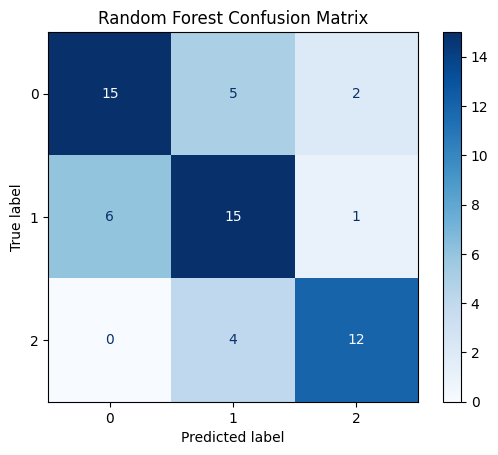

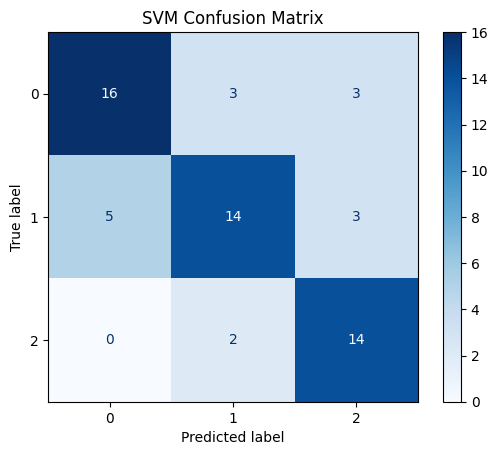

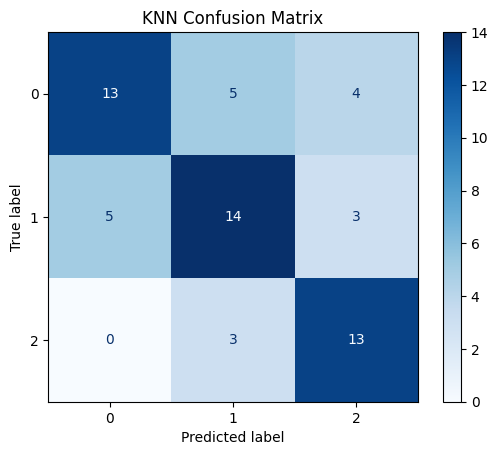

In [233]:
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.show()

# Plot confusion matrix for Random Forest
plot_confusion_matrix(y_test, rf.predict(X_test), "Random Forest Confusion Matrix")
# Plot confusion matrix for SVM
plot_confusion_matrix(y_test, svm.predict(X_test), "SVM Confusion Matrix")
# Plot confusion matrix for KNN
plot_confusion_matrix(y_test, knn.predict(X_test), "KNN Confusion Matrix")